# imports

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

#### setting matplotlib parameters for better visualization


In [2]:
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10

### loading the train and test images

In [3]:
train_image_path = 'images/image-35.jpg'  
train_mask_path = 'images/mask-35.png'    
test_image_path = 'images/image-83.jpg'   
test_mask_path = 'images/mask-83.png'     

# load  and readin images from images/ path.
train_img = cv2.imread(train_image_path)
test_img = cv2.imread(test_image_path)

# load and readin masks also from images/
train_mask = cv2.imread(train_mask_path, cv2.IMREAD_GRAYSCALE)
test_mask = cv2.imread(test_mask_path, cv2.IMREAD_GRAYSCALE)

##### convert BGR to RGB for proper display and standardize data from lab1

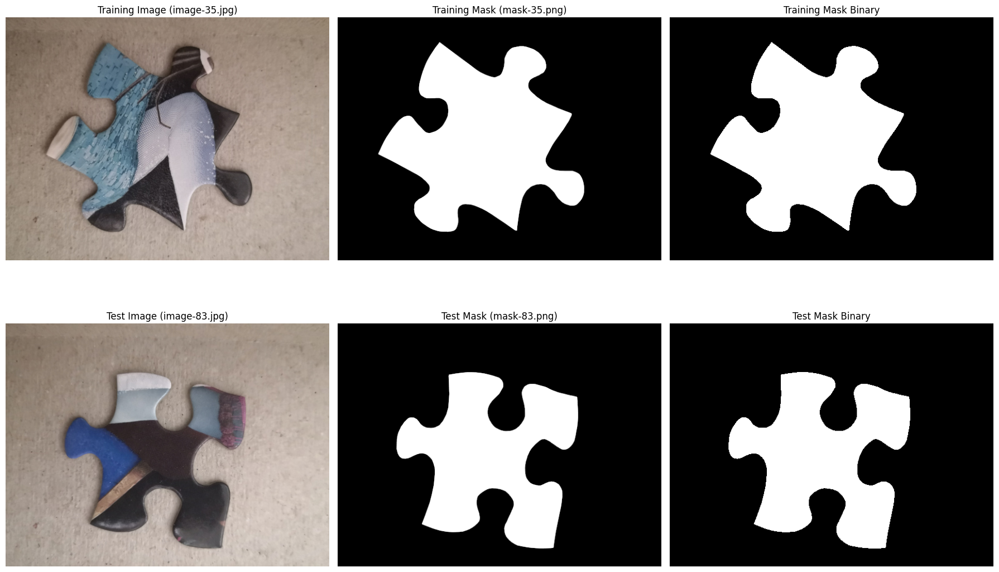

Training image shape: (450, 600, 3)
Test image shape: (450, 600, 3)
Training mask shape: (450, 600)
Test mask shape: (450, 600)

Training data statistics:
Foreground pixels: 74573 (27.6%)
Background pixels: 195427 (72.4%)
Total pixels: 270000


In [4]:
train_img_rgb = cv2.cvtColor(train_img, cv2.COLOR_BGR2RGB)
test_img_rgb = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)

# Convert masks to binary (0 for background, 1 for foreground)
train_mask_binary = (train_mask > 127).astype(int)
test_mask_binary = (test_mask > 127).astype(int)

# Convert to HSV
train_img_hsv = cv2.cvtColor(train_img_rgb, cv2.COLOR_RGB2HSV)
test_img_hsv = cv2.cvtColor(test_img_rgb, cv2.COLOR_RGB2HSV)

# Display original images and masks
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

axes[0, 0].imshow(train_img_rgb)
axes[0, 0].set_title('Training Image (image-35.jpg)')
axes[0, 0].axis('off')

axes[0, 1].imshow(train_mask, cmap='gray')
axes[0, 1].set_title('Training Mask (mask-35.png)')
axes[0, 1].axis('off')

axes[0, 2].imshow(train_mask_binary, cmap='gray')
axes[0, 2].set_title('Training Mask Binary')
axes[0, 2].axis('off')

axes[1, 0].imshow(test_img_rgb)
axes[1, 0].set_title('Test Image (image-83.jpg)')
axes[1, 0].axis('off')

axes[1, 1].imshow(test_mask, cmap='gray')
axes[1, 1].set_title('Test Mask (mask-83.png)')
axes[1, 1].axis('off')

axes[1, 2].imshow(test_mask_binary, cmap='gray')
axes[1, 2].set_title('Test Mask Binary')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

print(f"Training image shape: {train_img_rgb.shape}")
print(f"Test image shape: {test_img_rgb.shape}")
print(f"Training mask shape: {train_mask.shape}")
print(f"Test mask shape: {test_mask.shape}")

# Count foreground/background pixels in training data
fg_pixels = np.sum(train_mask_binary)
bg_pixels = np.sum(1 - train_mask_binary)
total_pixels = train_mask_binary.size

print(f"\nTraining data statistics:")
print(f"Foreground pixels: {fg_pixels} ({fg_pixels/total_pixels*100:.1f}%)")
print(f"Background pixels: {bg_pixels} ({bg_pixels/total_pixels*100:.1f}%)")
print(f"Total pixels: {total_pixels}")

#### Question 1.1 Gaussian Filter

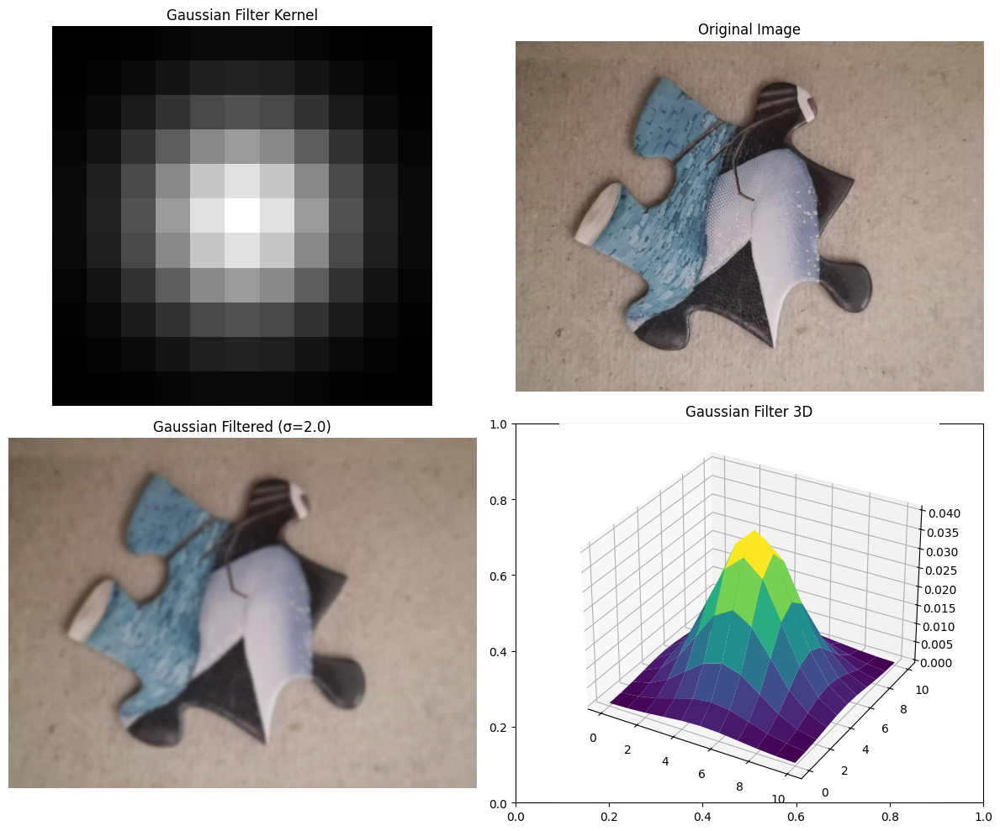

Gaussian filter parameters: size=11, σ=2.0
Filter sum: 1.000000


In [7]:
def create_gaussian_filter(size, sigma):
    """
    Create a Gaussian filter using Equation 1.
    
    Args:
        size: Filter size (should be odd)
        sigma: Standard deviation parameter
    
    Returns:
        Gaussian filter kernel
    """
    # Create coordinate grids centered at 0
    center = size // 2
    x, y = np.meshgrid(np.arange(-center, center + 1), 
                       np.arange(-center, center + 1))
    
    # Calculate Gaussian values
    gaussian = (1 / (2 * np.pi * sigma**2)) * np.exp(-(x**2 + y**2) / (2 * sigma**2))
    
    # Normalize to ensure sum = 1
    gaussian = gaussian / np.sum(gaussian)
    
    return gaussian

# Create Gaussian filter
gaussian_size = 11
gaussian_sigma = 2.0
gaussian_filter = create_gaussian_filter(gaussian_size, gaussian_sigma)

# Apply Gaussian filter to RGB image
gaussian_filtered = np.zeros_like(train_img_rgb, dtype=np.float32)
for i in range(3):  # Apply to each RGB channel
    gaussian_filtered[:, :, i] = cv2.filter2D(train_img_rgb[:, :, i].astype(np.float32), 
                                              -1, gaussian_filter)

# Display results
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes[0, 0].imshow(gaussian_filter, cmap='gray')
axes[0, 0].set_title('Gaussian Filter Kernel')
axes[0, 0].axis('off')

axes[0, 1].imshow(train_img_rgb)
axes[0, 1].set_title('Original Image')
axes[0, 1].axis('off')

axes[1, 0].imshow(gaussian_filtered.astype(np.uint8))
axes[1, 0].set_title(f'Gaussian Filtered (σ={gaussian_sigma})')
axes[1, 0].axis('off')

# Show 3D plot of Gaussian filter
ax = fig.add_subplot(2, 2, 4, projection='3d')
x, y = np.meshgrid(range(gaussian_size), range(gaussian_size))
ax.plot_surface(x, y, gaussian_filter, cmap='viridis')
ax.set_title('Gaussian Filter 3D')

plt.tight_layout()
plt.show()

print(f"Gaussian filter parameters: size={gaussian_size}, σ={gaussian_sigma}")
print(f"Filter sum: {np.sum(gaussian_filter):.6f}")

### 1.2 Laplacian of Gaussian (LoG) Filter


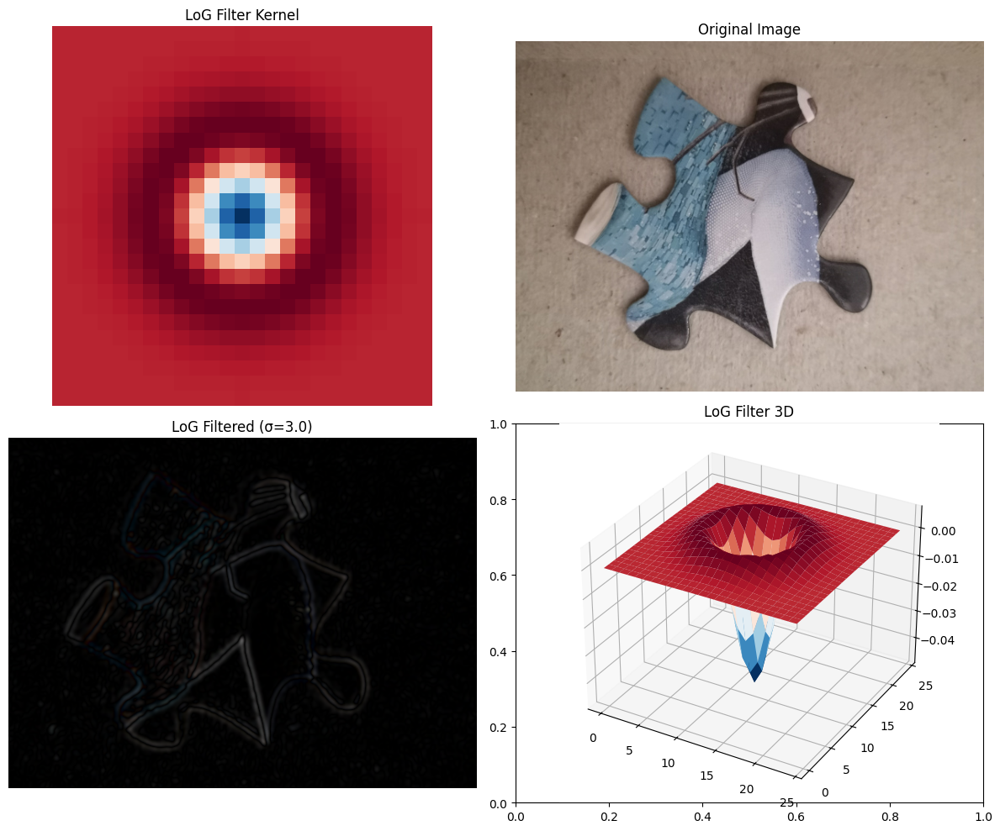

LoG filter parameters: size=25, σ=3.0
LoG filter min/max: -0.048226, 0.006527


In [8]:
def create_log_filter(size, sigma):
    """
    Create a Laplacian of Gaussian filter using Equation 2.
    
    Args:
        size: Filter size (should be odd)
        sigma: Standard deviation parameter
    
    Returns:
        LoG filter kernel
    """
    center = size // 2
    x, y = np.meshgrid(np.arange(-center, center + 1), 
                       np.arange(-center, center + 1))
    
    # Calculate LoG values using Equation 2
    r_squared = x**2 + y**2
    log_filter = -(1 / (np.pi * sigma**4)) * (1 - r_squared / (2 * sigma**2)) * \
                 np.exp(-r_squared / (2 * sigma**2))
    
    # Normalize so that sum of positive values equals sum of absolute negative values
    positive_sum = np.sum(log_filter[log_filter > 0])
    negative_sum = np.sum(np.abs(log_filter[log_filter < 0]))
    if positive_sum > 0 and negative_sum > 0:
        log_filter = log_filter / max(positive_sum, negative_sum)
    
    return log_filter

# Create LoG filter
log_size = 25
log_sigma = 3.0
log_filter = create_log_filter(log_size, log_sigma)

# Apply LoG filter to RGB image
log_filtered = np.zeros_like(train_img_rgb, dtype=np.float32)
for i in range(3):
    log_response = cv2.filter2D(train_img_rgb[:, :, i].astype(np.float32), 
                                -1, log_filter)
    # Normalize response for display
    log_filtered[:, :, i] = np.abs(log_response)

# Display results
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes[0, 0].imshow(log_filter, cmap='RdBu_r')
axes[0, 0].set_title('LoG Filter Kernel')
axes[0, 0].axis('off')

axes[0, 1].imshow(train_img_rgb)
axes[0, 1].set_title('Original Image')
axes[0, 1].axis('off')

axes[1, 0].imshow(log_filtered.astype(np.uint8))
axes[1, 0].set_title(f'LoG Filtered (σ={log_sigma})')
axes[1, 0].axis('off')

# Show 3D plot of LoG filter
ax = fig.add_subplot(2, 2, 4, projection='3d')
x, y = np.meshgrid(range(log_size), range(log_size))
ax.plot_surface(x, y, log_filter, cmap='RdBu_r')
ax.set_title('LoG Filter 3D')

plt.tight_layout()
plt.show()

print(f"LoG filter parameters: size={log_size}, σ={log_sigma}")
print(f"LoG filter min/max: {np.min(log_filter):.6f}, {np.max(log_filter):.6f}")

### 1.3 Difference of Gaussians (DoG) Filter


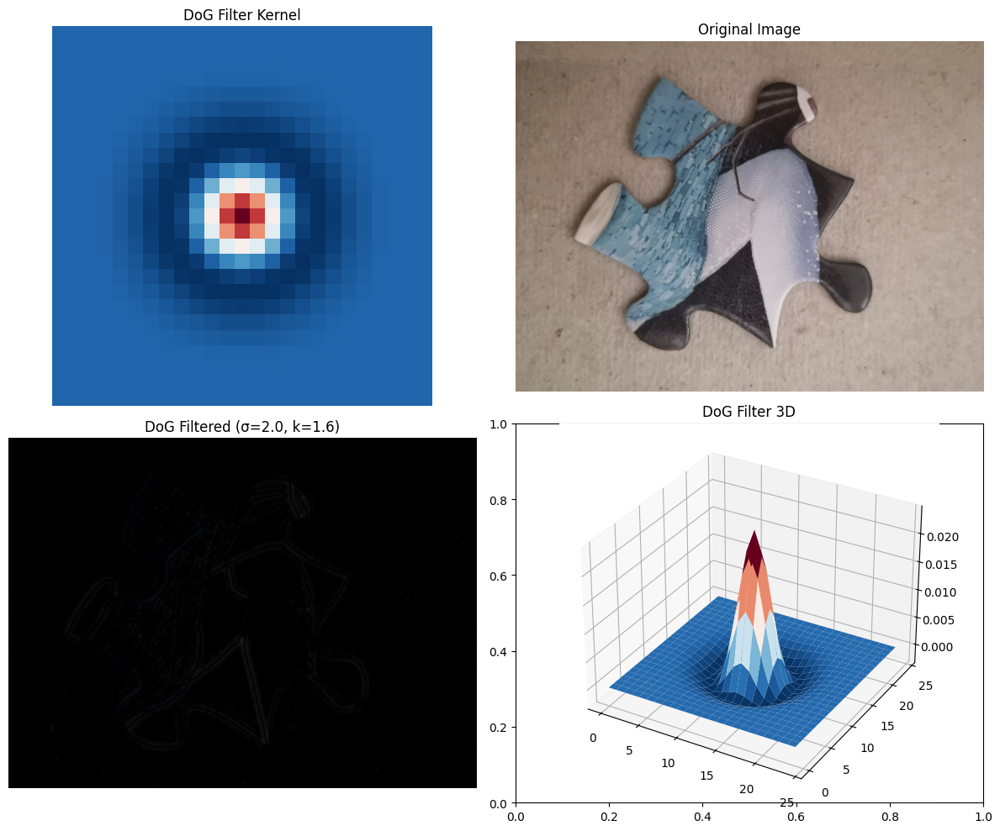

DoG filter parameters: size=25, σ=2.0, k=1.6
DoG filter min/max: -0.002837, 0.024246


In [9]:
def create_dog_filter(size, sigma, k=1.6):
    """
    Create a Difference of Gaussians filter using Equation 3.
    
    Args:
        size: Filter size (should be odd)
        sigma: Standard deviation parameter for smaller Gaussian
        k: Scale factor (k > 1.0) for larger Gaussian
    
    Returns:
        DoG filter kernel
    """
    center = size // 2
    x, y = np.meshgrid(np.arange(-center, center + 1), 
                       np.arange(-center, center + 1))
    
    # Calculate DoG values using Equation 3
    r_squared = x**2 + y**2
    
    gaussian1 = (1 / (2 * np.pi * sigma**2)) * np.exp(-r_squared / (2 * sigma**2))
    gaussian2 = (1 / (2 * np.pi * (k * sigma)**2)) * np.exp(-r_squared / (2 * (k * sigma)**2))
    
    dog_filter = gaussian1 - gaussian2
    
    return dog_filter

# Create DoG filter
dog_size = 25
dog_sigma = 2.0
dog_k = 1.6
dog_filter = create_dog_filter(dog_size, dog_sigma, dog_k)

# Apply DoG filter to RGB image
dog_filtered = np.zeros_like(train_img_rgb, dtype=np.float32)
for i in range(3):
    dog_response = cv2.filter2D(train_img_rgb[:, :, i].astype(np.float32), 
                                -1, dog_filter)
    # Normalize response for display
    dog_filtered[:, :, i] = np.abs(dog_response)

# Display results
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes[0, 0].imshow(dog_filter, cmap='RdBu_r')
axes[0, 0].set_title('DoG Filter Kernel')
axes[0, 0].axis('off')

axes[0, 1].imshow(train_img_rgb)
axes[0, 1].set_title('Original Image')
axes[0, 1].axis('off')

axes[1, 0].imshow(dog_filtered.astype(np.uint8))
axes[1, 0].set_title(f'DoG Filtered (σ={dog_sigma}, k={dog_k})')
axes[1, 0].axis('off')

# Show 3D plot of DoG filter
ax = fig.add_subplot(2, 2, 4, projection='3d')
x, y = np.meshgrid(range(dog_size), range(dog_size))
ax.plot_surface(x, y, dog_filter, cmap='RdBu_r')
ax.set_title('DoG Filter 3D')

plt.tight_layout()
plt.show()

print(f"DoG filter parameters: size={dog_size}, σ={dog_sigma}, k={dog_k}")
print(f"DoG filter min/max: {np.min(dog_filter):.6f}, {np.max(dog_filter):.6f}")

### Question 2.1 Create Gaussian Edge and Bar Filter Function


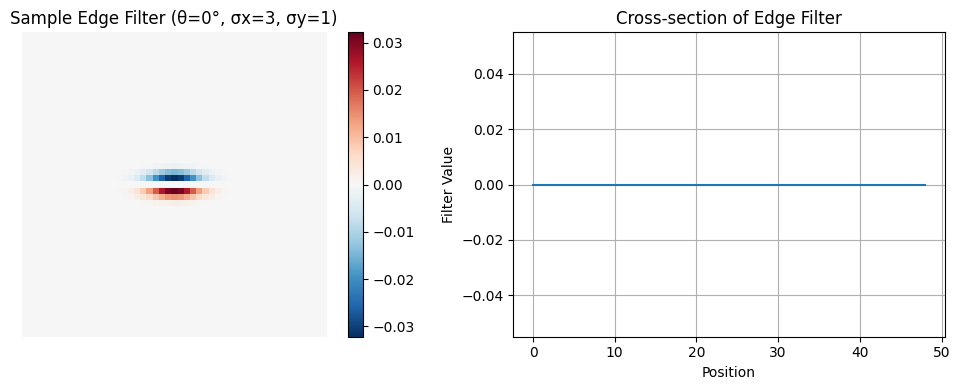

Gaussian derivative filter function created successfully!


In [10]:
def create_gaussian_derivative_filter(theta, sigma_x, sigma_y, size, derivative_order):
    """
    Create Gaussian edge (1st derivative) or bar (2nd derivative) filters.
    
    Args:
        theta: Orientation angle in radians
        sigma_x: Standard deviation in x direction
        sigma_y: Standard deviation in y direction  
        size: Filter size tuple (height, width)
        derivative_order: 1 for edge filter, 2 for bar filter
    
    Returns:
        Gaussian derivative filter
    """
    if isinstance(size, int):
        size = (size, size)
    
    h, w = size
    center_x, center_y = w // 2, h // 2
    
    # Create coordinate grids
    x, y = np.meshgrid(np.arange(-center_x, center_x + 1),
                       np.arange(-center_y, center_y + 1))
    
    # Apply rotation transformation
    x_prime = x * np.cos(theta) - y * np.sin(theta)
    y_prime = x * np.sin(theta) + y * np.cos(theta)
    
    # Gaussian function in x' direction
    f_x_prime = (1 / np.sqrt(2 * np.pi * sigma_x**2)) * \
                np.exp(-x_prime**2 / (2 * sigma_x**2))
    
    # Gaussian and its derivatives in y' direction
    f_y_prime = (1 / np.sqrt(2 * np.pi * sigma_y**2)) * \
                np.exp(-y_prime**2 / (2 * sigma_y**2))
    
    if derivative_order == 1:
        # First derivative (edge filter)
        df_dy_prime = f_y_prime * (-y_prime / sigma_y**2)
        filter_kernel = f_x_prime * df_dy_prime
    elif derivative_order == 2:
        # Second derivative (bar filter)
        d2f_dy2_prime = f_y_prime * (y_prime**2 - sigma_y**2) / sigma_y**4
        filter_kernel = f_x_prime * d2f_dy2_prime
    else:
        raise ValueError("derivative_order must be 1 or 2")
    
    # Flip y-axis as mentioned in hint
    filter_kernel = np.flipud(filter_kernel)
    
    return filter_kernel

# Test the function with sample parameters
test_filter = create_gaussian_derivative_filter(
    theta=0, sigma_x=3, sigma_y=1, size=49, derivative_order=1
)

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(test_filter, cmap='RdBu_r')
plt.title('Sample Edge Filter (θ=0°, σx=3, σy=1)')
plt.axis('off')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.plot(test_filter[24, :])  # Middle row
plt.title('Cross-section of Edge Filter')
plt.xlabel('Position')
plt.ylabel('Filter Value')
plt.grid(True)

plt.tight_layout()
plt.show()

print("Gaussian derivative filter function created successfully!")

### 2.2 Create RFS Filter Bank


Created RFS filter bank with 38 filters
Gaussian filters: 1
LoG filters: 1
Edge filters: 18
Bar filters: 18
Total: 38


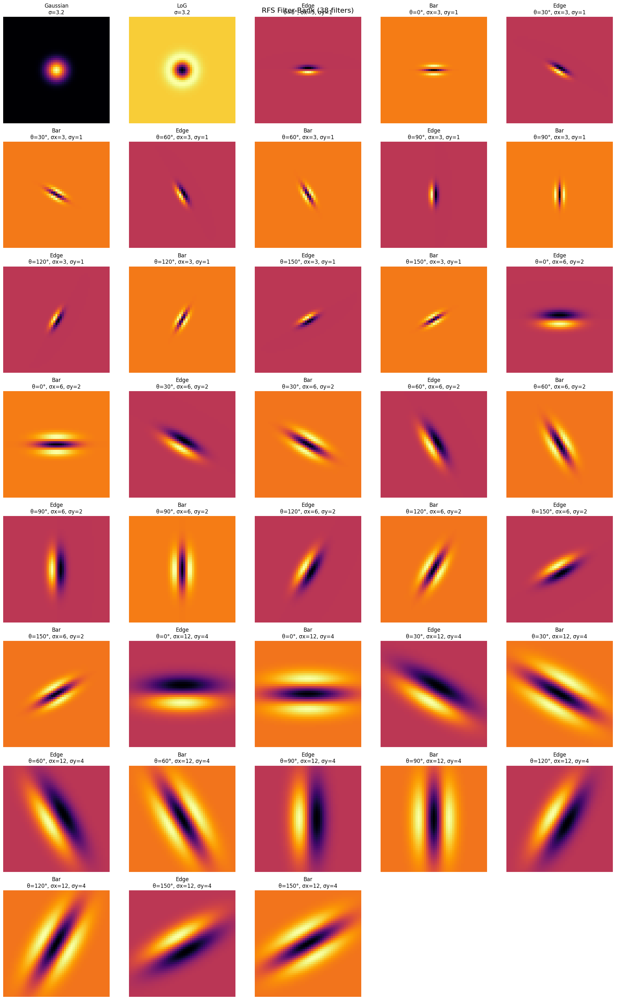

Applying RFS filters to training image...
RFS response shape: (450, 600, 38, 3)


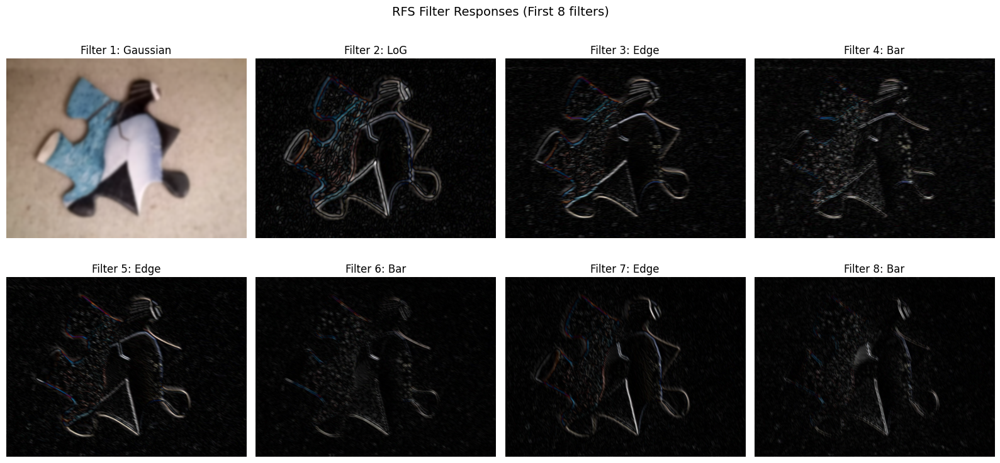

In [11]:
def create_rfs_filter_bank():
    """
    Create the RFS (Root Filter Set) bank with 38 filters.
    
    Returns:
        List of filter dictionaries with filter and metadata
    """
    filters = []
    
    # 1. Gaussian filter (σ² = 10)
    gaussian_sigma = np.sqrt(10)
    gaussian = create_gaussian_filter(49, gaussian_sigma)
    filters.append({
        'filter': gaussian,
        'type': 'Gaussian',
        'params': {'sigma': gaussian_sigma}
    })
    
    # 2. LoG filter (σ² = 10)
    log = create_log_filter(49, gaussian_sigma)
    filters.append({
        'filter': log,
        'type': 'LoG',
        'params': {'sigma': gaussian_sigma}
    })
    
    # 3. Gaussian edge and bar filters
    sigma_pairs = [(3, 1), (6, 2), (12, 4)]
    thetas = [0, np.pi/6, 2*np.pi/6, 3*np.pi/6, 4*np.pi/6, 5*np.pi/6]
    
    for sigma_x, sigma_y in sigma_pairs:
        for theta in thetas:
            # Edge filter (1st derivative)
            edge_filter = create_gaussian_derivative_filter(
                theta, sigma_x, sigma_y, 49, 1
            )
            filters.append({
                'filter': edge_filter,
                'type': 'Edge',
                'params': {'theta': theta, 'sigma_x': sigma_x, 'sigma_y': sigma_y}
            })
            
            # Bar filter (2nd derivative)
            bar_filter = create_gaussian_derivative_filter(
                theta, sigma_x, sigma_y, 49, 2
            )
            filters.append({
                'filter': bar_filter,
                'type': 'Bar',
                'params': {'theta': theta, 'sigma_x': sigma_x, 'sigma_y': sigma_y}
            })
    
    return filters

# Create RFS filter bank
rfs_filters = create_rfs_filter_bank()
print(f"Created RFS filter bank with {len(rfs_filters)} filters")

# Verify filter counts
gaussian_count = sum(1 for f in rfs_filters if f['type'] == 'Gaussian')
log_count = sum(1 for f in rfs_filters if f['type'] == 'LoG')
edge_count = sum(1 for f in rfs_filters if f['type'] == 'Edge')
bar_count = sum(1 for f in rfs_filters if f['type'] == 'Bar')

print(f"Gaussian filters: {gaussian_count}")
print(f"LoG filters: {log_count}")
print(f"Edge filters: {edge_count}")
print(f"Bar filters: {bar_count}")
print(f"Total: {gaussian_count + log_count + edge_count + bar_count}")

# Visualize RFS filter bank (similar to Figure 2)
fig, axes = plt.subplots(8, 5, figsize=(20, 32))
axes = axes.flatten()

# Plot first 38 filters (since we have 40 subplot positions)
for i, filter_info in enumerate(rfs_filters[:38]):
    axes[i].imshow(filter_info['filter'], cmap='inferno')
    filter_type = filter_info['type']
    if filter_type in ['Gaussian', 'LoG']:
        axes[i].set_title(f"{filter_type}\nσ={filter_info['params']['sigma']:.1f}")
    else:
        theta_deg = filter_info['params']['theta'] * 180 / np.pi
        axes[i].set_title(f"{filter_type}\nθ={theta_deg:.0f}°, σx={filter_info['params']['sigma_x']}, σy={filter_info['params']['sigma_y']}")
    axes[i].axis('off')

# Hide unused subplots
for i in range(38, len(axes)):
    axes[i].axis('off')

plt.suptitle('RFS Filter Bank (38 filters)', fontsize=16, y=0.98)
plt.tight_layout()
plt.show()

### Apply RFS Filter Bank to Training Image

def apply_rfs_filters(image, rfs_filters):
    """
    Apply RFS filter bank to an image.
    
    Args:
        image: Input image (H, W, C)
        rfs_filters: List of RFS filters
    
    Returns:
        Filter responses (H, W, num_filters, C)
    """
    h, w, c = image.shape
    num_filters = len(rfs_filters)
    
    # Initialize response array
    responses = np.zeros((h, w, num_filters, c), dtype=np.float32)
    
    # Apply each filter to each channel
    for f_idx, filter_info in enumerate(rfs_filters):
        filter_kernel = filter_info['filter']
        
        for channel in range(c):
            response = cv2.filter2D(image[:, :, channel].astype(np.float32), 
                                    -1, filter_kernel)
            responses[:, :, f_idx, channel] = response
    
    return responses

# Apply RFS filters to training image
print("Applying RFS filters to training image...")
rfs_responses = apply_rfs_filters(train_img_rgb, rfs_filters)
print(f"RFS response shape: {rfs_responses.shape}")

# Visualize some filter responses
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

# Show responses for first 8 filters
for i in range(8):
    # Take absolute value and normalize for visualization
    response = np.abs(rfs_responses[:, :, i, :])
    response_norm = (response - np.min(response)) / (np.max(response) - np.min(response))
    
    axes[i].imshow(response_norm)
    axes[i].set_title(f"Filter {i+1}: {rfs_filters[i]['type']}")
    axes[i].axis('off')

plt.suptitle('RFS Filter Responses (First 8 filters)', fontsize=14)
plt.tight_layout()
plt.show()

### 2.3 Create MR8 Features


Creating MR8 features...
MR8 features shape: (450, 600, 8, 3)


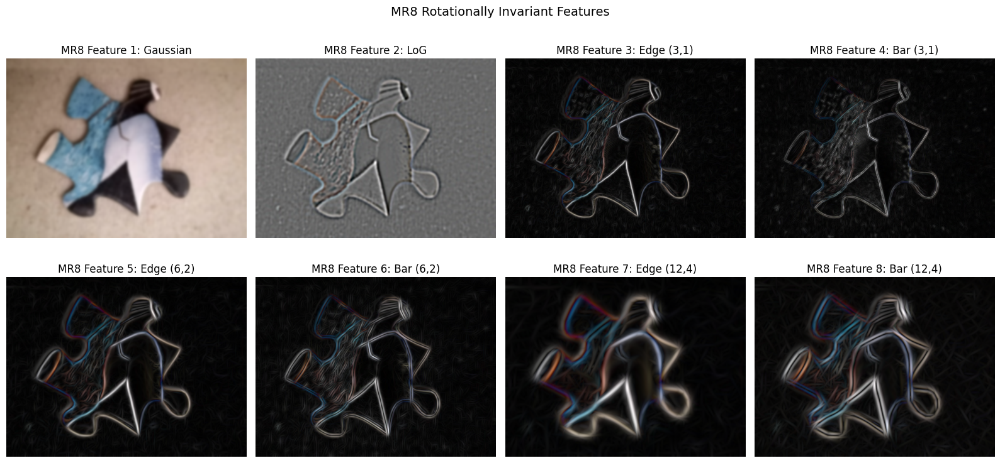

Creating RGB visualization for MR8 features...


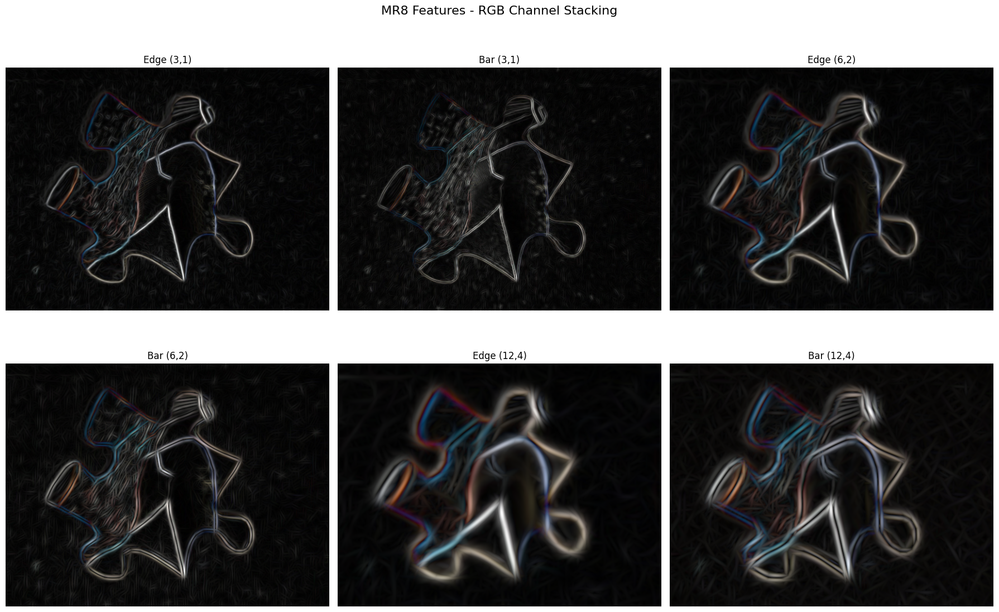

Types of features detected by these filters:
- Edge filters detect boundaries and transitions
- Bar filters detect ridges and valleys
- Different scales capture features at various sizes
- Maximum responses provide rotational invariance


In [12]:
def create_mr8_features(rfs_responses, rfs_filters):
    """
    Create MR8 rotationally invariant features from RFS responses.
    
    Args:
        rfs_responses: RFS filter responses (H, W, num_filters, C)
        rfs_filters: List of RFS filters with metadata
    
    Returns:
        MR8 features (H, W, 8, C)
    """
    h, w, _, c = rfs_responses.shape
    mr8_features = np.zeros((h, w, 8, c), dtype=np.float32)
    
    # First two features: Gaussian and LoG (rotationally symmetric)
    mr8_features[:, :, 0, :] = rfs_responses[:, :, 0, :]  # Gaussian
    mr8_features[:, :, 1, :] = rfs_responses[:, :, 1, :]  # LoG
    
    # Remaining 6 features: max responses for each (sigma_x, sigma_y) pair
    sigma_pairs = [(3, 1), (6, 2), (12, 4)]
    feature_idx = 2
    
    for sigma_x, sigma_y in sigma_pairs:
        # Find edge filter indices for this sigma pair
        edge_indices = []
        bar_indices = []
        
        for i, filter_info in enumerate(rfs_filters):
            if (filter_info['type'] == 'Edge' and 
                filter_info['params']['sigma_x'] == sigma_x and 
                filter_info['params']['sigma_y'] == sigma_y):
                edge_indices.append(i)
            elif (filter_info['type'] == 'Bar' and 
                  filter_info['params']['sigma_x'] == sigma_x and 
                  filter_info['params']['sigma_y'] == sigma_y):
                bar_indices.append(i)
        
        # Get maximum response across orientations for edge filters
        if edge_indices:
            edge_responses = rfs_responses[:, :, edge_indices, :]
            mr8_features[:, :, feature_idx, :] = np.max(np.abs(edge_responses), axis=2)
            feature_idx += 1
        
        # Get maximum response across orientations for bar filters
        if bar_indices:
            bar_responses = rfs_responses[:, :, bar_indices, :]
            mr8_features[:, :, feature_idx, :] = np.max(np.abs(bar_responses), axis=2)
            feature_idx += 1
    
    return mr8_features

# Create MR8 features
print("Creating MR8 features...")
mr8_features = create_mr8_features(rfs_responses, rfs_filters)
print(f"MR8 features shape: {mr8_features.shape}")

# Visualize MR8 features
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

feature_names = ['Gaussian', 'LoG', 'Edge (3,1)', 'Bar (3,1)', 
                'Edge (6,2)', 'Bar (6,2)', 'Edge (12,4)', 'Bar (12,4)']

for i in range(8):
    # Normalize feature for visualization
    feature = mr8_features[:, :, i, :]
    feature_norm = (feature - np.min(feature)) / (np.max(feature) - np.min(feature))
    
    axes[i].imshow(feature_norm)
    axes[i].set_title(f"MR8 Feature {i+1}: {feature_names[i]}")
    axes[i].axis('off')

plt.suptitle('MR8 Rotationally Invariant Features', fontsize=14)
plt.tight_layout()
plt.show()

# Create stacked RGB images for each MR8 feature type
print("Creating RGB visualization for MR8 features...")

# For submission requirement: stack R,G,B channels for common features
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Show the 6 directional filters (excluding Gaussian and LoG)
for idx in range(6):
    feature_idx = idx + 2  # Skip Gaussian and LoG
    row = idx // 3
    col = idx % 3
    
    # Stack RGB channels
    rgb_feature = mr8_features[:, :, feature_idx, :]
    # Normalize each channel
    for c in range(3):
        channel = rgb_feature[:, :, c]
        rgb_feature[:, :, c] = (channel - np.min(channel)) / (np.max(channel) - np.min(channel))
    
    axes[row, col].imshow(rgb_feature)
    axes[row, col].set_title(feature_names[feature_idx])
    axes[row, col].axis('off')

plt.suptitle('MR8 Features - RGB Channel Stacking', fontsize=16)
plt.tight_layout()
plt.show()

print("Types of features detected by these filters:")
print("- Edge filters detect boundaries and transitions")
print("- Bar filters detect ridges and valleys")
print("- Different scales capture features at various sizes")
print("- Maximum responses provide rotational invariance")


### question 3.1 Local Binary Patterns


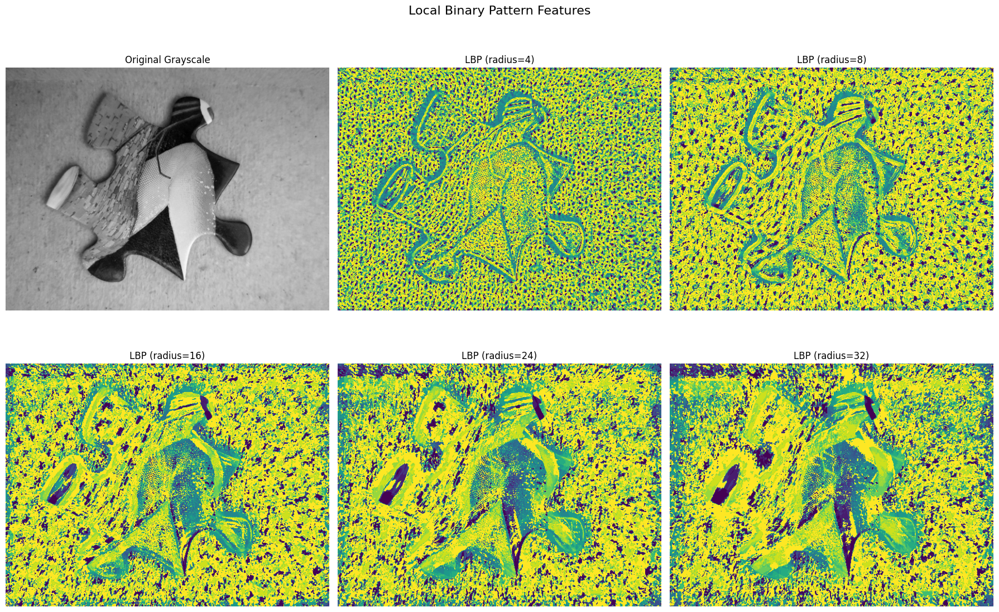

LBP features computed for radii: [4, 8, 16, 24, 32]
Number of sampling points: 12


In [13]:
def apply_lbp_features(image, radii=[4, 8, 16, 24, 32], n_points=12):
    """
    Apply Local Binary Pattern features with multiple radii.
    
    Args:
        image: Input grayscale image
        radii: List of radius values
        n_points: Number of sampling points
    
    Returns:
        Dictionary of LBP features for each radius
    """
    lbp_features = {}
    
    for radius in radii:
        lbp = local_binary_pattern(image, n_points, radius, method='uniform')
        lbp_features[f'lbp_r{radius}'] = lbp
    
    return lbp_features

# Convert training image to grayscale for LBP
train_gray = cv2.cvtColor(train_img_rgb, cv2.COLOR_RGB2GRAY)

# Apply LBP with different radii
lbp_results = apply_lbp_features(train_gray)

# Visualize LBP results
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

axes[0].imshow(train_gray, cmap='gray')
axes[0].set_title('Original Grayscale')
axes[0].axis('off')

radii = [4, 8, 16, 24, 32]
for i, radius in enumerate(radii):
    axes[i+1].imshow(lbp_results[f'lbp_r{radius}'], cmap='viridis')
    axes[i+1].set_title(f'LBP (radius={radius})')
    axes[i+1].axis('off')

plt.suptitle('Local Binary Pattern Features', fontsize=16)
plt.tight_layout()
plt.show()

print("LBP features computed for radii:", radii)
print("Number of sampling points:", 12)

### 3.2 Integral Images


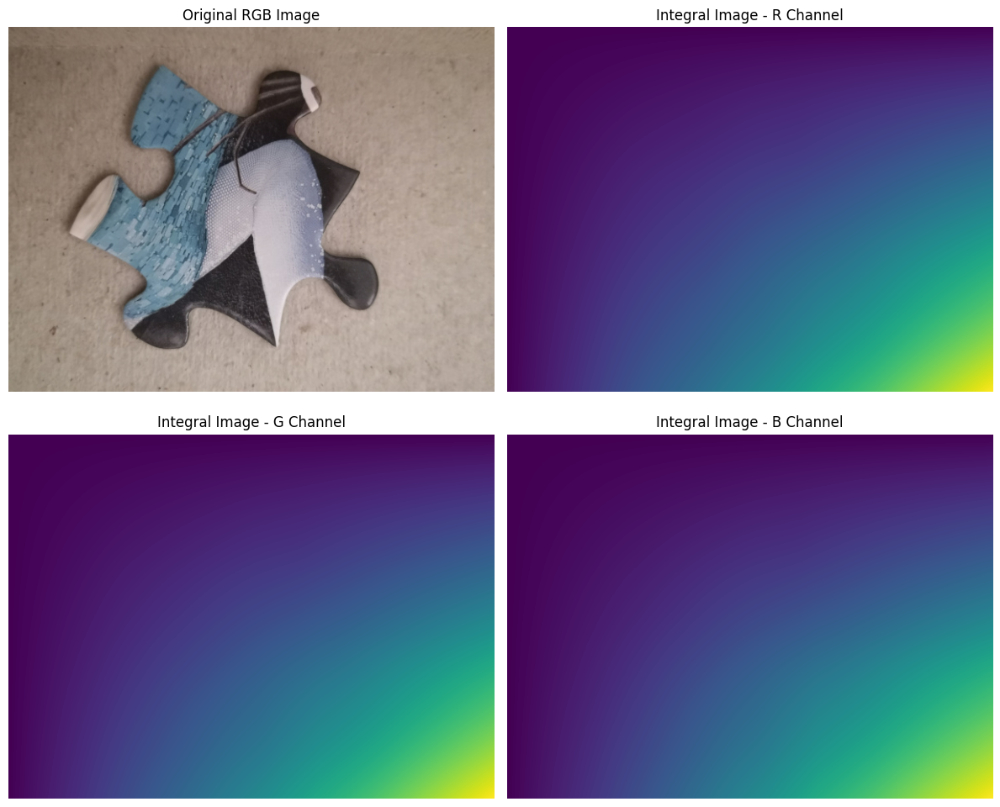

Integral images computed for RGB channels
Integral image shapes: {'R': (451, 601), 'G': (451, 601), 'B': (451, 601)}


In [14]:
def compute_integral_image(image):
    """
    Compute integral image for efficient rectangle sum computation.
    
    Args:
        image: Input image (single channel)
    
    Returns:
        Integral image
    """
    return cv2.integral(image.astype(np.float32))

# Compute integral images for RGB channels
integral_images = {}
for i, channel in enumerate(['R', 'G', 'B']):
    integral_images[channel] = compute_integral_image(train_img_rgb[:, :, i])

# Visualize integral images
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0, 0].imshow(train_img_rgb)
axes[0, 0].set_title('Original RGB Image')
axes[0, 0].axis('off')

for i, (channel, integral_img) in enumerate(integral_images.items()):
    row = (i + 1) // 2
    col = (i + 1) % 2
    axes[row, col].imshow(integral_img, cmap='viridis')
    axes[row, col].set_title(f'Integral Image - {channel} Channel')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

print("Integral images computed for RGB channels")
print("Integral image shapes:", {k: v.shape for k, v in integral_images.items()})

### 3.3 Haar Filters


Applying Haar filters...


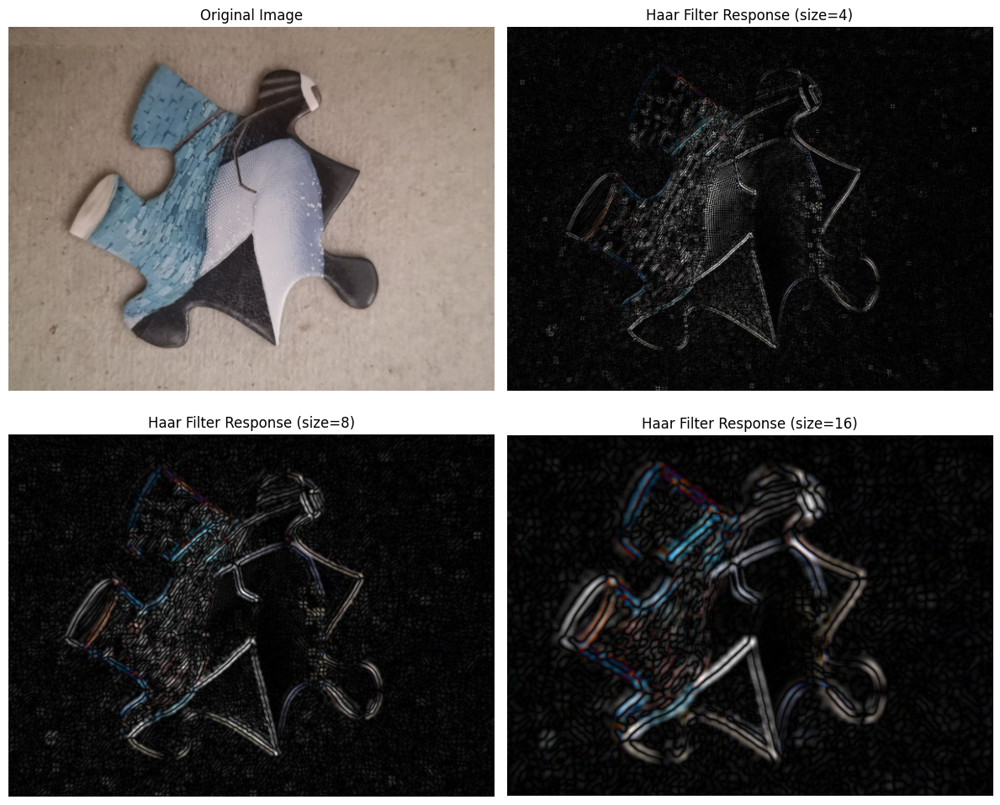

Haar filters applied with sizes: [4, 8, 16]
Haar response shapes: {'haar_4': (447, 597, 3), 'haar_8': (443, 593, 3), 'haar_16': (435, 585, 3)}


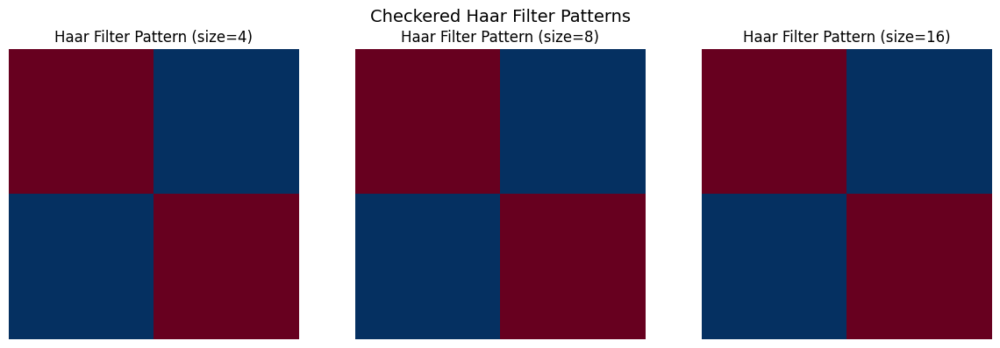

In [16]:
def apply_haar_filter_integral(integral_img, x, y, size):
    """
    Apply checkered Haar filter using integral image.
    
    Args:
        integral_img: Integral image
        x, y: Top-left corner coordinates
        size: Filter size (square)
    
    Returns:
        Haar filter response
    """
    half_size = size // 2
    
    # Ensure coordinates are within bounds
    if x + size >= integral_img.shape[1] or y + size >= integral_img.shape[0]:
        return 0
    
    # Get sums for each quadrant using integral image
    # Top-left quadrant (positive)
    sum_tl = (integral_img[y + half_size, x + half_size] - 
              integral_img[y, x + half_size] - 
              integral_img[y + half_size, x] + 
              integral_img[y, x])
    
    # Top-right quadrant (negative)
    sum_tr = (integral_img[y + half_size, x + size] - 
              integral_img[y, x + size] - 
              integral_img[y + half_size, x + half_size] + 
              integral_img[y, x + half_size])
    
    # Bottom-left quadrant (negative)
    sum_bl = (integral_img[y + size, x + half_size] - 
              integral_img[y + half_size, x + half_size] - 
              integral_img[y + size, x] + 
              integral_img[y + half_size, x])
    
    # Bottom-right quadrant (positive)
    sum_br = (integral_img[y + size, x + size] - 
              integral_img[y + half_size, x + size] - 
              integral_img[y + size, x + half_size] + 
              integral_img[y + half_size, x + half_size])
    
    # Checkered pattern: TL and BR are positive, TR and BL are negative
    haar_response = sum_tl - sum_tr - sum_bl + sum_br
    
    return haar_response

def apply_haar_filters_to_image(image, integral_images, filter_sizes=[4, 8, 16]):
    """
    Apply Haar filters to entire image using integral images.
    
    Args:
        image: Original RGB image
        integral_images: Dictionary of integral images for each channel
        filter_sizes: List of filter sizes to apply
    
    Returns:
        Dictionary of Haar filter responses
    """
    h, w, c = image.shape
    haar_responses = {}
    
    for size in filter_sizes:
        # Initialize response arrays for each channel
        responses = np.zeros((h - size + 1, w - size + 1, c), dtype=np.float32)
        
        # Apply Haar filter at each position
        for y in range(h - size + 1):
            for x in range(w - size + 1):
                for channel_idx, channel in enumerate(['R', 'G', 'B']):
                    response = apply_haar_filter_integral(
                        integral_images[channel], x, y, size
                    )
                    responses[y, x, channel_idx] = response
        
        haar_responses[f'haar_{size}'] = responses
    
    return haar_responses

# Apply Haar filters
print("Applying Haar filters...")
haar_filter_sizes = [4, 8, 16]
haar_responses = apply_haar_filters_to_image(train_img_rgb, integral_images, haar_filter_sizes)

# Visualize Haar filter responses
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0, 0].imshow(train_img_rgb)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

for i, size in enumerate(haar_filter_sizes):
    row = (i + 1) // 2
    col = (i + 1) % 2 if i < 2 else 1
    
    # Normalize response for visualization
    response = haar_responses[f'haar_{size}']
    response_norm = np.abs(response)
    response_norm = (response_norm - np.min(response_norm)) / (np.max(response_norm) - np.min(response_norm))
    
    axes[row, col].imshow(response_norm)
    axes[row, col].set_title(f'Haar Filter Response (size={size})')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

print(f"Haar filters applied with sizes: {haar_filter_sizes}")
print("Haar response shapes:", {k: v.shape for k, v in haar_responses.items()})

# Create checkered Haar filter visualization
def create_haar_filter_pattern(size):
    """Create visualization of checkered Haar filter pattern."""
    pattern = np.zeros((size, size))
    half_size = size // 2
    
    # Top-left and bottom-right quadrants = +1
    pattern[:half_size, :half_size] = 1
    pattern[half_size:, half_size:] = 1
    
    # Top-right and bottom-left quadrants = -1
    pattern[:half_size, half_size:] = -1
    pattern[half_size:, :half_size] = -1
    
    return pattern

# Show Haar filter patterns
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for i, size in enumerate(haar_filter_sizes):
    pattern = create_haar_filter_pattern(size)
    axes[i].imshow(pattern, cmap='RdBu_r', vmin=-1, vmax=1)
    axes[i].set_title(f'Haar Filter Pattern (size={size})')
    axes[i].axis('off')

plt.suptitle('Checkered Haar Filter Patterns', fontsize=14)
plt.tight_layout()
plt.show()


### question 4.1 Extract All Features and Apply K-Means Clustering


In [17]:
def extract_all_features(image, image_hsv, rfs_responses, mr8_features, lbp_results, haar_responses):
    """
    Extract all features for pixel classification.
    
    Returns:
        Feature matrix (num_pixels, num_features)
    """
    h, w, c = image.shape
    features = []
    
    # 1. RGB features
    rgb_features = image.reshape(-1, 3)
    features.append(rgb_features)
    
    # 2. HSV features
    hsv_features = image_hsv.reshape(-1, 3)
    features.append(hsv_features)
    
    # 3. Prewitt filters (implement basic versions)
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    prewitt_x = cv2.filter2D(gray, -1, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
    prewitt_y = cv2.filter2D(gray, -1, np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]))
    features.append(prewitt_x.reshape(-1, 1))
    features.append(prewitt_y.reshape(-1, 1))
    
    # 4. Laplacian filter
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    features.append(laplacian.reshape(-1, 1))
    
    # 5. MR8 features (flatten across channels)
    mr8_flat = mr8_features.reshape(-1, 8 * c)
    features.append(mr8_flat)
    
    # 6. LBP features (use one radius for simplicity)
    lbp_feature = lbp_results['lbp_r8'].reshape(-1, 1)
    features.append(lbp_feature)
    
    # 7. Haar filter responses (flatten across channels and sizes)
    haar_flat = []
    for size in [4, 8, 16]:
        if f'haar_{size}' in haar_responses:
            response = haar_responses[f'haar_{size}']
            # Pad response to match image size
            padded_response = np.zeros((h, w, c))
            padded_response[:response.shape[0], :response.shape[1], :] = response
            haar_flat.append(padded_response.reshape(-1, c))
    
    if haar_flat:
        haar_combined = np.concatenate(haar_flat, axis=1)
        features.append(haar_combined)
    
    # Concatenate all features
    all_features = np.concatenate(features, axis=1)
    
    return all_features

# Extract all features
print("Extracting all features...")
all_features = extract_all_features(
    train_img_rgb, train_img_hsv, rfs_responses, mr8_features, lbp_results, haar_responses
)

print(f"Feature matrix shape: {all_features.shape}")
print(f"Number of features per pixel: {all_features.shape[1]}")

# Apply K-Means clustering with 4 clusters
print("Applying K-Means clustering...")
n_clusters = 4

# Subsample pixels for faster clustering (optional)
subsample_ratio = 0.1  # Use 10% of pixels
n_samples = int(all_features.shape[0] * subsample_ratio)
indices = np.random.choice(all_features.shape[0], n_samples, replace=False)
features_subsample = all_features[indices]

# Fit K-Means on subsample
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
kmeans.fit(features_subsample)

# Predict labels for all pixels
print("Predicting cluster labels for all pixels...")
texton_labels = kmeans.predict(all_features)
texton_image = texton_labels.reshape(train_img_rgb.shape[:2])

print(f"Texton clustering completed with {n_clusters} clusters")

Extracting all features...
Feature matrix shape: (270000, 43)
Number of features per pixel: 43
Applying K-Means clustering...
Predicting cluster labels for all pixels...
Texton clustering completed with 4 clusters


### 4.2 Display Texton Image


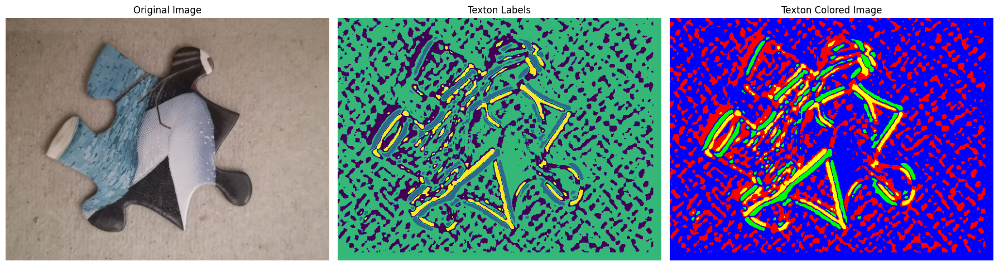

Cluster statistics:
Cluster 0: 69716 pixels (25.8%)
Cluster 1: 12734 pixels (4.7%)
Cluster 2: 177358 pixels (65.7%)
Cluster 3: 10192 pixels (3.8%)


In [18]:
# Create texton visualization
texton_colors = np.array([
    [255, 0, 0],      # Red
    [0, 255, 0],      # Green  
    [0, 0, 255],      # Blue
    [255, 255, 0]     # Yellow
])

texton_colored = texton_colors[texton_labels].reshape(train_img_rgb.shape)

# Display results
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(train_img_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(texton_image, cmap='viridis')
axes[1].set_title('Texton Labels')
axes[1].axis('off')

axes[2].imshow(texton_colored.astype(np.uint8))
axes[2].set_title('Texton Colored Image')
axes[2].axis('off')

plt.tight_layout()
plt.show()

# Show cluster statistics
unique_labels, counts = np.unique(texton_labels, return_counts=True)
print("Cluster statistics:")
for label, count in zip(unique_labels, counts):
    percentage = (count / len(texton_labels)) * 100
    print(f"Cluster {label}: {count} pixels ({percentage:.1f}%)")


### 4.3 Train Statistical Pixel Classifier


In [19]:
print("Applying MR8 features to HSV image...")
rfs_responses_hsv = apply_rfs_filters(train_img_hsv, rfs_filters)
mr8_features_hsv = create_mr8_features(rfs_responses_hsv, rfs_filters)

# Extract features including HSV MR8
def extract_features_with_hsv_mr8(image, image_hsv, mr8_rgb, mr8_hsv, texton_labels):
    """Extract features including HSV MR8 features."""
    features = []
    
    # RGB and HSV
    features.append(image.reshape(-1, 3))
    features.append(image_hsv.reshape(-1, 3))
    
    # MR8 features from RGB
    features.append(mr8_rgb.reshape(-1, 8 * 3))
    
    # MR8 features from HSV
    features.append(mr8_hsv.reshape(-1, 8 * 3))
    
    # Texton labels
    features.append(texton_labels.reshape(-1, 1))
    
    return np.concatenate(features, axis=1)

features_enhanced = extract_features_with_hsv_mr8(
    train_img_rgb, train_img_hsv, mr8_features, mr8_features_hsv, texton_labels
)

print(f"Enhanced feature matrix shape: {features_enhanced.shape}")

# Train enhanced classifier
X_train_enh, X_val_enh, y_train_enh, y_val_enh = train_test_split(
    features_enhanced, ground_truth.ravel(), 
    test_size=0.3, random_state=42, stratify=ground_truth.ravel()
)

nb_enhanced = GaussianNB()
nb_enhanced.fit(X_train_enh, y_train_enh)

y_pred_enh = nb_enhanced.predict(X_val_enh)
accuracy_enhanced = accuracy_score(y_val_enh, y_pred_enh)

print(f"Enhanced classifier accuracy: {accuracy_enhanced:.4f}")
print(f"Improvement: {accuracy_enhanced - accuracy_nb:.4f}")


Applying MR8 features to HSV image...
Enhanced feature matrix shape: (270000, 55)


NameError: name 'ground_truth' is not defined